# ➥ Principle Component Analysis(PCA)

In [1]:
import plotly.express as px
import pandas as pd 
import numpy as np

from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import time
import matplotlib.pyplot as plt

In [2]:
housing = pd.read_csv('housing.csv')
housing = housing[['HouseAge','AveRooms','AveBedrms','MedHouseVal']]
housing.head()

,HouseAge,AveRooms,AveBedrms,MedHouseVal
0,41.0,6.984127,1.023810,4.526
1,21.0,6.238137,0.971880,3.585
2,52.0,8.288136,1.073446,3.521
3,52.0,5.817352,1.073059,3.413
4,52.0,6.281853,1.081081,3.422


In [3]:
scaler = StandardScaler()

In [4]:
housing_mean = scaler.fit_transform(housing.iloc[:,0:3])

In [5]:
pd.DataFrame(housing_mean,columns=housing[['HouseAge','AveRooms','AveBedrms']].columns).head()

,HouseAge,AveRooms,AveBedrms
0,0.982143,0.628559,-0.153758
1,-0.607019,0.327041,-0.263336
2,1.856182,1.155620,-0.049016
3,1.856182,0.156966,-0.049833
4,1.856182,0.344711,-0.032906


In [6]:
conv = np.cov([housing_mean[0],housing_mean[1],housing_mean[2]])

In [7]:
conv

array([[ 0.33788507, -0.04313262,  0.55903821],
       [-0.04313262,  0.22318864, -0.0996601 ],
       [ 0.55903821, -0.0996601 ,  0.92861911]])

In [8]:
eigen_values, eigen_vectors = np.linalg.eig(conv)

In [9]:
eigen_values

array([1.27651979e+00, 9.80186527e-18, 2.13173031e-01])

In [10]:
eigen_vectors

array([[ 0.51249807, -0.85155217,  0.11047457],
       [-0.10165893,  0.06758053,  0.9925212 ],
       [ 0.85264951,  0.51989592,  0.05193299]])

In [11]:
pc = eigen_vectors[[0,2]]
pc 

array([[ 0.51249807, -0.85155217,  0.11047457],
       [ 0.85264951,  0.51989592,  0.05193299]])

In [13]:
housing_tf = np.dot(housing.iloc[:,0:3],pc.T)
new_housing = pd.DataFrame(housing_tf,columns=['PC1','PC2'])
new_housing['MedHouseVal'] = housing['MedHouseVal'].values
new_housing.head()

,PC1,PC2,MedHouseVal
0,15.178177,38.642819,4.526
1,5.557728,21.199294,3.585
2,19.710708,48.702490,3.521
3,21.814667,47.417919,3.413
4,21.420006,47.659828,3.422


In [14]:
new_housing['MedHouseVal'] = new_housing['MedHouseVal'].astype('str')
fig = px.scatter(x=new_housing['PC1'],
                 y=new_housing['PC2'],
                 color=new_housing['MedHouseVal'],
                 color_discrete_sequence=px.colors.qualitative.G10
                )

fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

## PCA using sklearn

In [15]:
from sklearn.decomposition import PCA

In [16]:
pca = PCA(n_components=2)

In [17]:
housing_trf = pca.fit_transform(housing_mean)

In [18]:
housing_trf

array([[ 0.15321964,  0.98967229],
       [ 0.15787789, -0.61388386],
       [ 0.43393877,  1.9098885 ],
       ...,
       [ 0.14047169, -0.90626647],
       [ 0.23652628, -0.80498267],
       [ 0.23042824, -0.9669902 ]])

In [19]:
pca.explained_variance_
# Eigen values

array([1.87816151, 0.97301267])

In [20]:
pca.explained_variance_ratio_
#totat 90% data carying

array([0.62602351, 0.32432184])

In [21]:
ei_v = pca.components_
# Eigen vectors

In [22]:
housing_tf1 = np.dot(housing.iloc[:,0:3],ei_v.T)
new_housing = pd.DataFrame(housing_tf1,columns=['PC1','PC2'])
new_housing['MedHouseVal'] = housing['MedHouseVal'].values
new_housing.head()

,PC1,PC2,MedHouseVal
0,-1.922244,40.989234,4.526
1,1.185027,21.297268,3.585
2,-2.991852,51.898935,3.521
3,-4.719526,51.690311,3.413
4,-4.389234,51.730921,3.422


In [23]:
new_housing['MedHouseVal'] = new_housing['MedHouseVal'].astype('str')
fig = px.scatter(x=new_housing['PC1'],
                 y=new_housing['PC2'],
                 color=new_housing['MedHouseVal'],
                 color_discrete_sequence=px.colors.qualitative.G10
                )

fig.update_traces(marker=dict(size=12,
                              line=dict(width=2,
                                        color='DarkSlateGrey')),
                  selector=dict(mode='markers'))
fig.show()

## PCA test on MNIST Datasets

### Without Applying PCA

In [24]:
dr = pd.read_csv('digit.csv')
dr.sample(5)

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
40671,3,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
20159,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
38460,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
27046,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
9998,7,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


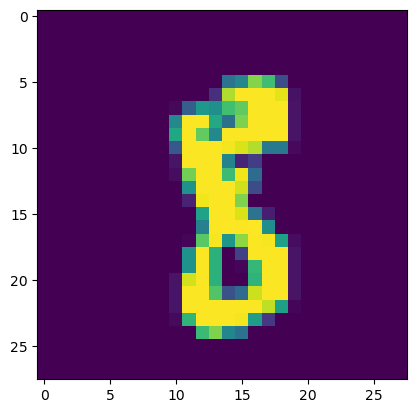

In [25]:
plt.imshow(dr.iloc[23989,1:].values.reshape(28,28))

In [ ]:
dr.shape

In [26]:
# Train datasets
X_train,X_test,y_train,y_test = train_test_split(dr.iloc[:,1:],dr.iloc[:,0],test_size=0.2,random_state=42)

In [27]:
knn = KNeighborsClassifier()

In [28]:
knn.fit(X_train,y_train)

KNeighborsClassifier()

In [29]:
start = time.time()
y_pred = knn.predict(X_test.values)
print('Time(s):',time.time() - start)

C:\Users\shaki\AppData\Local\anaconda3\Lib\site-packages\sklearn\base.py:493: UserWarning:

X does not have valid feature names, but KNeighborsClassifier was fitted with feature names



Time(s): 6.256773948669434


In [30]:
accu = accuracy_score(y_test,y_pred)

In [31]:
accu

0.9648809523809524

### Applying PCA

In [32]:
dr.head()

,label,pixel0,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,...,pixel774,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783
0,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
1,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
2,1,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
3,4,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
4,0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0


In [33]:
scaler = StandardScaler()

In [34]:
X1_train = scaler.fit_transform(X_train)
X1_test = scaler.fit_transform(X_test)

In [35]:
pca = PCA(n_components=150)

In [36]:
X1_train_tf = pca.fit_transform(X1_train)
X1_test_tf = pca.transform(X1_test)

In [37]:
knn.fit(X1_train_tf,y_train)

KNeighborsClassifier()

In [38]:
start = time.time()
y_pred = knn.predict(X1_test_tf)
print('Time(s):',time.time() - start)

Time(s): 0.7825660705566406


In [39]:
accu1 = accuracy_score(y_test,y_pred)

In [40]:
accu1

0.9523809523809523